#### SVR Loc PnP Solving Test


In [1]:
import os
import cv2
import math
import tyro
import torch
import importlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

from PIL import Image
from dataclasses import dataclass
from tqdm.autonotebook import tqdm
from torch.utils.data import DataLoader, DistributedSampler

from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA

os.environ["CUDA_VISIBLE_DEVICES"] = "3"

/tmp/ipykernel_3955531/423141043.py:14: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [2]:
import sys
from config.strv_eval import CONFIG as args

##### Global Stuff ######
sys.path.append('.')

# Load configuration from config/exp_strv_Eval.py instead of using tyro
try:
    print(f"Configuration loaded from config/strv_config.py")
except ImportError:
    # Fallback to tyro if the import fails
    @dataclass
    class Args:
        expid: str = 'exp_strv_Eval'
    args = tyro.cli(Args)
    print(f"Using command line arguments with expid: {args.expid}")

# --------------------------------------------------------------------------------
# [LSV-Loc EVALUATION] Load Dataset
# --------------------------------------------------------------------------------

CONFIG = importlib.import_module(f"config.{args.expid}").CONFIG
get_dataset = importlib.import_module(f"utility.Database.{CONFIG.dataloader}").get_dataset

print('==================================================================================')
print('===================== SVR-Loc: Range Image-based Localization ====================')
print('==================================================================================\n')

print('===: CONFIG =====================================================================')
for attr in vars(CONFIG):
    if not attr.startswith('__'):
        value = getattr(CONFIG, attr)
        value_str = str(value)
        print(f"\033[1;33m{attr.center(30)}: {value_str.center(30)}\033[0m")
        
os.makedirs(CONFIG.expdir, exist_ok=True)
config_file_path = os.path.join(CONFIG.expdir, 'training_config.txt')
with open(config_file_path, 'w') as f:
    f.write('===: TRAINING CONFIGURATION ===\n\n')
    for attr in vars(CONFIG):
        if not attr.startswith('__'):
            value = getattr(CONFIG, attr)
            f.write(f"{attr}: {str(value)}\n")
    f.write('\n===: END OF CONFIGURATION ===')

print('===: TRAINING ===================================================================')

# --------------------------------------------------------------------------------
# [LSV-Loc EVALUATION] Generate Embeddings
# --------------------------------------------------------------------------------

def get_lidar_image_embeddings(valid_loader, model):

    valid_image_embeddings = []
    with torch.no_grad():
        for batch in tqdm(valid_loader):
            image_embeddings = model.lidar_embeddings(batch)
            valid_image_embeddings.append(image_embeddings)
    return torch.cat(valid_image_embeddings)

def get_camera_image_embeddings(valid_loader, model):

    valid_image_embeddings = []
    with torch.no_grad():
        for batch in tqdm(valid_loader):
            image_embeddings = model.camera_embeddings(batch)
            valid_image_embeddings.append(image_embeddings)
    return torch.cat(valid_image_embeddings)

# --------------------------------------------------------------------------------
# [LSV-Loc EVALUATION] Evaluation
# --------------------------------------------------------------------------------

Configuration loaded from config/strv_config.py
===================== SVR-Loc: Range Image-based Localization ====================

===: CONFIG =====================================================================
             mode             :        LIDAR_simulation       
            debug             :             False             
            expid             :           strv_eval           
         current_date         :            04160633           
            device            :              cuda             
          batch_size          :               10              
         num_workers          :               24              
          image_size          :              518              
       mixed_precision        :              True             
           port_num           :             12346             
          pin_memory          :              True             
     CUDA_VISIBLE_DEVICES     :              [0]              
            epochs            

/usr/local/lib/python3.12/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [3]:
model_path = CONFIG.final_model_path
model = importlib.import_module(f"utility.Backbone.{CONFIG.model}").Model(CONFIG)
model.to(CONFIG.device)
model.load_state_dict(torch.load(model_path, map_location=CONFIG.device))
model.eval()

valid_dataset = get_dataset(mode=CONFIG.test_dataset, CONFIG=CONFIG)
valid_loader = DataLoader(dataset=valid_dataset, 
                            batch_size=CONFIG.batch_size, 
                            num_workers=CONFIG.num_workers,
                            shuffle=CONFIG.test_shuffle)

/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/home/iris/Workspace/Sangmin/SVR_Loc/utility/Backbone/CLIP_AIO.py:133: UserWarning: Using lambda is incompatible with multiprocessing. Consider using regular functions or partial().
  A.Lambda(
Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: Us

===: [LSV-Loc INFO] Training Image Encoder ===


In [4]:
# Save or load precomputed embeddings
lidar_file = os.path.join(CONFIG.expdir, 'lidar_embeddings_Test.pt')
camera_file = os.path.join(CONFIG.expdir, 'camera_embeddings_Test.pt')

lidar_embeddings = None
camera_embeddings = None

if os.path.exists(lidar_file) and os.path.exists(camera_file):
    # load saved embeddings
    lidar_embeddings = torch.load(lidar_file, map_location=CONFIG.device)
    camera_embeddings = torch.load(camera_file, map_location=CONFIG.device)
    print(f'Loaded embeddings: lidar {lidar_embeddings.shape}, camera {camera_embeddings.shape}')
else:
    # save current embeddings to disk
    torch.save(lidar_embeddings.cpu(), lidar_file)
    torch.save(camera_embeddings.cpu(), camera_file)
    # move back to device
    lidar_embeddings = lidar_embeddings.to(CONFIG.device)
    camera_embeddings = camera_embeddings.to(CONFIG.device)
    print(f'Saved embeddings to {lidar_file} and {camera_file}')
    
total_queries = valid_dataset.dbStruct.numQ

Loaded embeddings: lidar torch.Size([18922, 768]), camera torch.Size([18922, 768])


### Estimate LiDAR Position using Equi-PnP -------------------------------

##### 0. Loading Function Group

In [60]:
import gc
import torch
import tifffile
import numpy as np
import torch.nn.functional as F

from sklearn.neighbors import NearestNeighbors
from scipy.optimize import least_squares
from sklearn.linear_model import RANSACRegressor
from scipy.spatial.transform import Rotation as R


def process_path(path):
    # Remove leading '.' if it exists
    if path.startswith('./'):
        path = path[2:]
    
    # Prepend the dataset directory
    return f"dataset/SVR_Dataset_Sync/{path}"

def attention_map(model, image_tensor, layer_idx=None):
    """
    model: SVRMatcher_Test.model
    image_tensor: torch.Tensor, shape (B, C, H, W)
    layer_idx: int or None. None이면 마지막 블록 사용
    """
    # BCHW 입력 지원
    if image_tensor.dim() == 3:
        # (C, H, W) → (1, C, H, W)
        img = image_tensor.unsqueeze(0)
    else:
        img = image_tensor

    vit = model.encoder.encoder
    patch_size = vit.patch_embed.proj.kernel_size[0]
    B, C, H, W = img.shape
    new_H = (H // patch_size) * patch_size
    new_W = (W // patch_size) * patch_size
    h_patches = new_H // patch_size
    w_patches = new_W // patch_size

    if layer_idx is None:
        layer_idx = len(vit.blocks) - 1

    R = getattr(vit, "register_tokens", torch.empty(1,0)).shape[1]

    attn_maps = []
    def hook_fn(module, inp, out):
        attn_maps.append(out.detach().cpu())
    handle = vit.blocks[layer_idx].attn.attn_drop.register_forward_hook(hook_fn)

    with torch.no_grad():
        x = img
        x = x[..., :new_H, :new_W]
        _ = vit(x)

    handle.remove()
    if not attn_maps:
        print("No attention maps captured.")
        return

    attn_all = attn_maps[0][0]        # (heads, tokens, tokens)
    attn = attn_all.sum(dim=0)        # (tokens, tokens)
    cls_to_p = attn[0, 1 + R:]        # (h_patches*w_patches,)
    cls_map = cls_to_p.reshape(h_patches, w_patches)
    
    return cls_map

def preprocess_img_tensor(img, patch_size=14, device=None):
    """
    img: torch.Tensor or numpy.ndarray, shape (C, H, W) or (H, W, C)
    patch_size: int, patch size for ViT
    device: torch.device or None
    Returns: img_tensor (1, C, new_H, new_W) on device
    """
    import albumentations as A
    
    
    transform = A.Compose([
        A.Normalize(max_pixel_value=255.0),
    ])
    
    # img가 numpy라면 그대로, tensor라면 numpy로 변환
    if isinstance(img, np.ndarray):
        img_np = img  # HxWxC
    else:
        img_np = img.permute(1, 2, 0).cpu().numpy()  # CxHxW -> HxWxC

    H, W = img_np.shape[0], img_np.shape[1]
    new_H = (H // patch_size) * patch_size
    new_W = (W // patch_size) * patch_size
    if (H != new_H) or (W != new_W):
        img_np = np.array(
            A.Resize(new_H, new_W)(image=img_np)['image']
        )
        
    img_np = transform(image=img_np)['image']
        
    img_tensor = torch.tensor(img_np).permute(2, 0, 1).float().unsqueeze(0)
    if device is not None:
        img_tensor = img_tensor.to(device)
        
    grid_size = (new_H // patch_size, new_W // patch_size)
    
    return img_tensor, grid_size

def plot_attention_overlay(img_tensor, attn_map_resized, alpha=0.5, cmap='jet'):
    """
    img_tensor: torch.Tensor, shape (1, 3, H, W) or (3, H, W)
    attn_map_resized: np.ndarray, shape (H, W), normalized to [0,1]
    alpha: float, blending ratio for overlay (0=only image, 1=only attention)
    cmap: str, matplotlib colormap for attention
    """
    # img_tensor: (1, 3, H, W) or (3, H, W)
    if img_tensor.dim() == 4:
        img_np = img_tensor.squeeze(0).detach().cpu().numpy()
    else:
        img_np = img_tensor.detach().cpu().numpy()
    # (3, H, W) -> (H, W, 3)
    img_np = np.transpose(img_np, (1, 2, 0))
    # Normalize image to [0,1] for display
    img_min, img_max = img_np.min(), img_np.max()
    if img_max > 1.0:
        img_np = (img_np - img_min) / (img_max - img_min + 1e-8)
    # Attention map to color
    attn_color = plt.get_cmap(cmap)(attn_map_resized)[..., :3]  # (H, W, 3)
    # Overlay
    overlay = (1 - alpha) * img_np + alpha * attn_color
    overlay = np.clip(overlay, 0, 1)
    plt.figure(figsize=(40, 20))
    plt.imshow(overlay)
    plt.title(f"Attention Overlay (alpha={alpha})")
    plt.axis('off')
    plt.show()
    
    return overlay

def mutual_nearest_neighbors(database_tokens, query_tokens, grid_size):
        
    knn_q2d = NearestNeighbors(n_neighbors=1)
    knn_q2d.fit(database_tokens)
    dist_q2d, idx_q2d = knn_q2d.kneighbors(query_tokens)
    idx_q2d = idx_q2d.squeeze(1)  # shape: (num_query_patches,)

    # 2. db→query (query_tokens에서 database_tokens의 최근접 이웃)
    knn_d2q = NearestNeighbors(n_neighbors=1)
    knn_d2q.fit(query_tokens)
    dist_d2q, idx_d2q = knn_d2q.kneighbors(database_tokens)
    idx_d2q = idx_d2q.squeeze(1)  # shape: (num_db_patches,)

    # 3. Mutual Nearest Neighbor 매칭
    mutual_matches = []
    for db_idx, query_idx in enumerate(idx_d2q):
        if idx_q2d[query_idx] == db_idx:
            mutual_matches.append((query_idx, db_idx))

    # 필요하다면 매칭 결과를 numpy array로 변환
    mutual_matches = np.array(mutual_matches)

    def idx_to_source_position(idx, patch_size, grid_size):
        row = (idx // grid_size[1]) * patch_size + patch_size / 2
        col = (idx % grid_size[1]) * patch_size + patch_size / 2
        return row, col

    for query_idx, db_idx in mutual_matches:
        rowA, colA = idx_to_source_position(query_idx, 14, grid_size)
        rowB, colB = idx_to_source_position(db_idx, 14, grid_size)

        rowA = float(rowA)
        colA = float(colA)
        rowB = float(rowB)
        colB = float(colB)

        xyA = (colA, rowA)  # query
        xyB = (colB, rowB)  # database
        
            
    return mutual_matches, xyA, xyB

def idx_to_source_position(idx, grid_size):
    row = (idx // grid_size[1]) * 14 + 14 / 2
    col = (idx % grid_size[1]) * 14 + 14 / 2
    return row, col

def single_point_from_range_image(u, v, depth, range_image):

    numCols = range_image.shape[1]
    numRows = range_image.shape[0]
    
    r = float(depth)

    # 수평 각도 (azimuth): u=0 -> -pi, u=numCols-1 -> pi
    az = -np.pi + u * (2 * np.pi / (numCols - 1))

    # 수직 각도 (elevation): v=0 -> +22.5°, v=numRows-1 -> -22.5°
    el = np.deg2rad(22.5) - v * (np.deg2rad(45) / (numRows - 1))

    x = r * np.cos(el) * np.sin(az)
    y = r * np.cos(el) * np.cos(az)
    z = r * np.sin(el)

    return np.array([x, y, z])

def rotation_y(yaw):

    return np.array([
        [np.cos(yaw), -np.sin(yaw), 0],
        [np.sin(yaw),  np.cos(yaw), 0],
        [0, 0, 1]
    ])

def project_equirectangular(P_cam, width, height):
    x_w, y_w, z_w = P_cam
    x = x_w
    y = z_w
    z = y_w
    r = np.linalg.norm(P_cam)
    
    if r < 1e-8:
        return np.array([width/2, height/2])
    
    theta = np.arctan2(x, z)       # azimuth ∈ [−π,π]
    phi   = np.arcsin(y / r)       # elevation ∈ [−π/4,π/4]

    u = (theta + np.pi) / (2*np.pi) * width
    v = (np.pi/4 - phi)    / (np.pi/2) * (height)
    
    return np.array([u, v])

def residuals(params, world_points, image_points, width, height, cam_height):
    tx, ty, cam_height, yaw = params
    R_h = rotation_y(yaw)
    # t = np.array([tx, ty, cam_height])
    t = np.array([tx, cam_height, ty])
    res = []

    for P_w, uv_meas in zip(world_points, image_points):
        # 1) World → Camera 상대 좌표
        p = P_w - t                 # p = [p_east, p_north, p_up]
        P_cam = R_h @ p
        
        # 3) equirect 투영
        u_proj, v_proj = project_equirectangular(P_cam, width, height)
        # 4) 잔차
        res.append(u_proj - uv_meas[0])
        res.append(v_proj - uv_meas[1])
        
        # print(f"u_proj: {u_proj:.2f}, v_proj: {v_proj:.2f}, u_meas: {uv_meas[0]:.2f}, v_meas: {uv_meas[1]:.2f}")       
    if len(res) > 0:
        res_np = np.array(res).reshape(-1, 2)
        mean_residual = np.mean(np.linalg.norm(res_np, axis=1))
        
    # print(f"Mean residual: {mean_residual:.4f}")
    # print("-------------------------------")
            
    return np.array(res)


def collect_world_and_image_points(filtered_matches, grid_size, range_image, scale_factor=1.5, plot=True):
    """
    Collects world_points and image_points from filtered_matches and optionally plots (u, v) points on the range image.

    Args:
        filtered_matches: list of (q_idx, d_idx) tuples
        grid_size: tuple, grid size for idx_to_source_position
        range_image: np.ndarray, the range image
        scale_factor: float, scale factor used for resizing
        plot: bool, whether to plot the points on the range image

    Returns:
        world_points: list of 3D points
        image_points: list of 2D points
    """
    world_points, image_points = [], []
    points_u, points_v = [], []
    for q_idx, d_idx in filtered_matches:
        rB, cB = idx_to_source_position(d_idx, grid_size)
        image_points.append([cB, rB])
        rA, cA = idx_to_source_position(q_idx, grid_size)
        u, v = int(round(cA)), int(round(rA))
        v = v - int(64 * scale_factor)
        if 0 <= v < range_image.shape[0] and 0 <= u < range_image.shape[1]:
            depth = range_image[v, u]
            world_points.append(single_point_from_range_image(u, v, depth, range_image))
            points_u.append(u)
            points_v.append(v)
    if plot:
        plt.figure(figsize=(12, 6))
        plt.imshow(range_image, cmap='viridis')
        plt.title('Range Image with (u, v) Points')
        plt.xlabel('u (column)')
        plt.ylabel('v (row)')
        plt.scatter(points_u, points_v, color='red', s=60, marker='o', label='(u, v) points')
        plt.legend()
        plt.show()
    return world_points, image_points


In [70]:
i=1500
#Failure = 1500 / Success = 6000
max_k = 1

##### 1. Matching Query to Database

In [71]:
import time


start_time = time.perf_counter()
dot_similarity = lidar_embeddings[i] @ camera_embeddings.T
values, predictions = torch.topk(dot_similarity.squeeze(0), max_k)
elapsed_ms = (time.perf_counter() - start_time) * 1000
print(f"Retrieval runtime: {elapsed_ms:.2f} ms")

queryIdx = i
queryPos = valid_dataset.dbStruct.utmQ[i]

predictions = predictions.squeeze()
matches_at_k = {}

#
dbIdx = predictions.item()
qIdx = i
db_image_path = process_path(valid_dataset.dbStruct.dbImage[dbIdx])
query_image_path = process_path(valid_dataset.dbStruct.qImage[qIdx])
range_image_path = process_path(valid_dataset.dbStruct.qRange[qIdx])
db_pos = valid_dataset.dbStruct.utmDb[dbIdx]
# 
db_img = cv2.imread(db_image_path)
db_img = cv2.cvtColor(db_img, cv2.COLOR_BGR2RGB)

query_img = cv2.imread(query_image_path)
query_img = cv2.cvtColor(query_img, cv2.COLOR_BGR2RGB)

range_image = tifffile.imread(range_image_path)
range_image = range_image/1000

scale_factor = 1.5
db_img = cv2.resize(db_img, (int(db_img.shape[1] * scale_factor), int(db_img.shape[0] * scale_factor)), interpolation=cv2.INTER_LINEAR)
query_img = cv2.resize(query_img, (int(query_img.shape[1] * scale_factor), int(query_img.shape[0] * scale_factor)), interpolation=cv2.INTER_LINEAR)
range_image = cv2.resize(range_image, (int(range_image.shape[1] * scale_factor), int(range_image.shape[0] * scale_factor)), interpolation=cv2.INTER_LINEAR)

db_img_tensor, grid_size = preprocess_img_tensor(db_img, patch_size=14, device=CONFIG.device)
query_img_tensor, grid_size = preprocess_img_tensor(query_img, patch_size=14, device=CONFIG.device)

# Calculate distance between query and DB positions
distance = np.linalg.norm(queryPos - db_pos)
print(f"Distance between query and DB: {distance:.2f} m")

Retrieval runtime: 8.19 ms
Distance between query and DB: 123.88 m


##### 2. Attention-based Filtering

torch.Size([3, 378, 1526]) torch.Size([3, 378, 1526])
(1, 2943, 768)


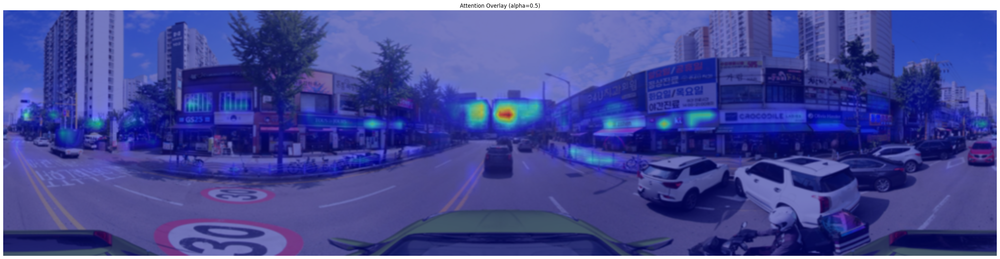

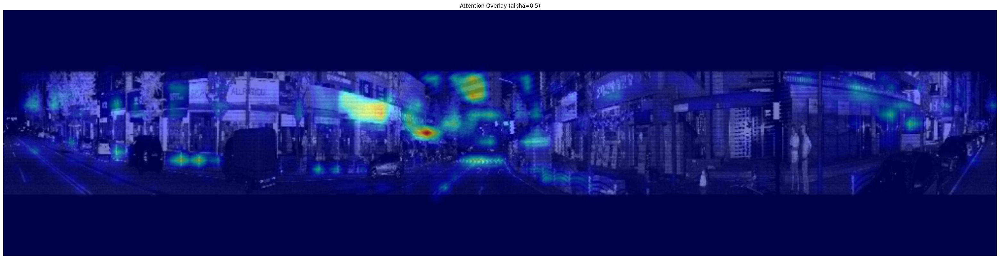

In [73]:
# double the spatial resolution of both tensors
# img_tensor_DB_Interp = F.interpolate(db_img_tensor.unsqueeze(0), scale_factor=1, mode='bilinear', align_corners=False)
# img_tensor_Q_Interp  = F.interpolate(query_img_tensor.unsqueeze(0),  scale_factor=1, mode='bilinear', align_corners=False)

img_tensor_DB_Interp = db_img_tensor[0]
img_tensor_Q_Interp  = query_img_tensor[0]

# img_tensor_DB_Interp = db_img_tensor
# img_tensor_Q_Interp = query_img_tensor

print(img_tensor_DB_Interp.shape, img_tensor_Q_Interp.shape)
with torch.inference_mode():
    img_tensor_DB_Interp = img_tensor_DB_Interp.unsqueeze(0).to(CONFIG.device)
    tokens_DB = model.encoder.encoder.get_intermediate_layers(img_tensor_DB_Interp)[0]
    tokens_DB_CPU = tokens_DB.detach().cpu().numpy()

del tokens_DB
gc.collect()
torch.cuda.empty_cache()

with torch.inference_mode():
    img_tensor_Q_Interp = img_tensor_Q_Interp.unsqueeze(0).to(CONFIG.device)
    tokens_Q = model.encoder.encoder.get_intermediate_layers(img_tensor_Q_Interp)[0]
    tokens_Q_CPU = tokens_Q.detach().cpu().numpy()

del tokens_Q
gc.collect()
torch.cuda.empty_cache()

print(tokens_Q_CPU.shape)
H, W = db_img_tensor.shape[2], db_img_tensor.shape[3]

cls_map_DB_ORG = attention_map(model, img_tensor_DB_Interp, layer_idx=-1)
cls_map_DB = cls_map_DB_ORG.cpu().numpy()
cls_map_DB = (cls_map_DB - cls_map_DB.min()) / (cls_map_DB.max() - cls_map_DB.min() + 1e-8)
cls_map_DB = cv2.resize(cls_map_DB, (W, H), interpolation=cv2.INTER_LINEAR)

cls_map_Q_ORG = attention_map(model, img_tensor_Q_Interp, layer_idx=-1)
cls_map_Q = cls_map_Q_ORG.cpu().numpy()
cls_map_Q = (cls_map_Q - cls_map_Q.min()) / (cls_map_Q.max() - cls_map_Q.min() + 1e-8)
cls_map_Q = cv2.resize(cls_map_Q, (W, H), interpolation=cv2.INTER_LINEAR)

# Overlay plot
db_overlay = plot_attention_overlay(db_img_tensor, cls_map_DB, alpha=0.5, cmap='jet')
query_overlay = plot_attention_overlay(query_img_tensor, cls_map_Q, alpha=0.5, cmap='jet')


##### 3. Feature Append / Attention Filtering

In [75]:
print(tokens_DB_CPU.shape, tokens_Q_CPU.shape)

start_nn = time.perf_counter()
mutual_matches, q_coords, db_coords = mutual_nearest_neighbors(tokens_DB_CPU[0], tokens_Q_CPU[0], grid_size)
nn_elapsed_ms = (time.perf_counter() - start_nn) * 1000
print(f"Nearest neighbors runtime: {nn_elapsed_ms:.2f} ms")

q_scores = cls_map_Q_ORG.flatten()
d_scores = cls_map_DB_ORG.flatten()

percentile = 95
q_thr = np.percentile(q_scores, percentile)
d_thr = np.percentile(d_scores, percentile)

print(f"Query threshold: {q_thr}, Database threshold: {d_thr}")

start_filter = time.perf_counter()
filtered_matches = [
    (q, d) for q, d in mutual_matches
    if q_scores[q] >= q_thr and d_scores[d] >= d_thr
]
filter_elapsed_ms = (time.perf_counter() - start_filter) * 1000
print(f"Feature filtering runtime: {filter_elapsed_ms:.2f} ms")

print(f"Filtered from {len(mutual_matches)} to {len(filtered_matches)} matches")
grid_size

(1, 2943, 768) (1, 2943, 768)
Nearest neighbors runtime: 94.20 ms
Query threshold: 0.014616709388792523, Database threshold: 0.01514940243214371
Feature filtering runtime: 1.67 ms
Filtered from 222 to 5 matches


(27, 109)

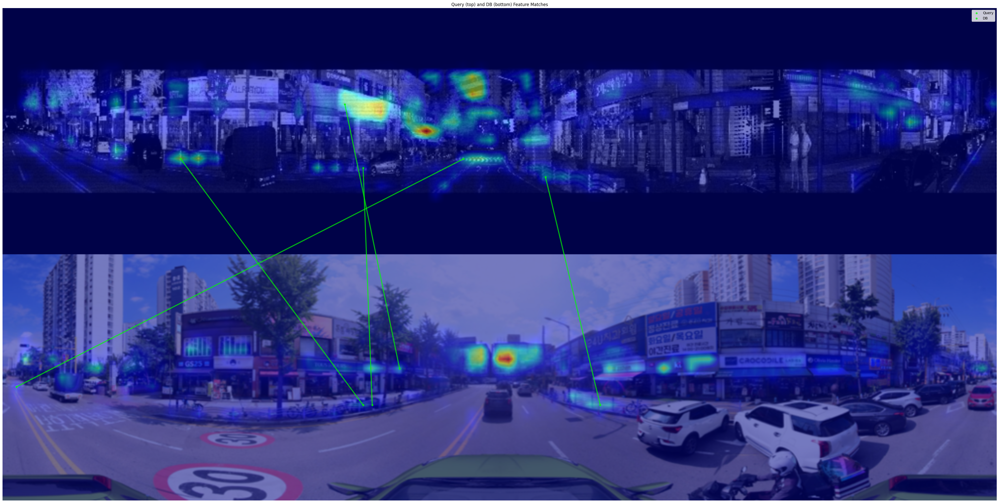

In [76]:
def plot_feature_matches(query_img, db_img, filtered_matches,
                         query_gridSize, database_gridSize,
                         plot=True):
    import numpy as np
    import matplotlib.pyplot as plt

    def idx_to_source_position(idx, grid_size):
        row = (idx // grid_size[1]) * 14 + 14 / 2
        col = (idx % grid_size[1]) * 14 + 14 / 2
        return row, col

    # stack query above db
    combined = np.vstack([query_img, db_img])
    h_query = query_img.shape[0]

    fig, ax = plt.subplots(figsize=(40, 20))
    ax.imshow(combined)
    ax.axis('off')
    ax.set_title('Query (top) and DB (bottom) Feature Matches')

    # draw lines and collect query centers
    query_centers = []
    for q_idx, d_idx in filtered_matches:
        # get patch centers
        row_q, col_q = idx_to_source_position(q_idx, query_gridSize)
        row_d, col_d = idx_to_source_position(d_idx, database_gridSize)

        # line from (col_q,row_q) to (col_d,row_d + h_query)
        ax.plot([col_q, col_d],
                [row_q, row_d + h_query],
                color='lime', linewidth=3, alpha=0.7)

        query_centers.append((row_q, col_q))

    # scatter query points (red)
    q_x = [c for _,c in query_centers]
    q_y = [r for r,_ in query_centers]
    ax.scatter(q_x, q_y, color='lime', s=20, label='Query', alpha=0.7)

    # scatter db points (blue)
    db_points = [idx_to_source_position(d, database_gridSize)
                 for _, d in filtered_matches]
    db_x = [c for r, c in db_points]
    db_y = [r + h_query for r, c in db_points]
    ax.scatter(db_x, db_y, color='lime', s=20, label='DB', alpha=0.7)

    ax.legend(loc='upper right')
    plt.tight_layout()
    if plot:
        plt.show()
    else:
        plt.close(fig)

    return query_centers

query_centers = plot_feature_matches(query_overlay, db_overlay, filtered_matches, grid_size, grid_size, plot=True)

##### 4. Equirectangular PnP Solving

Δ East: 10.16 m, Δ North: 6.25 m, Δ heading: 188.50 deg


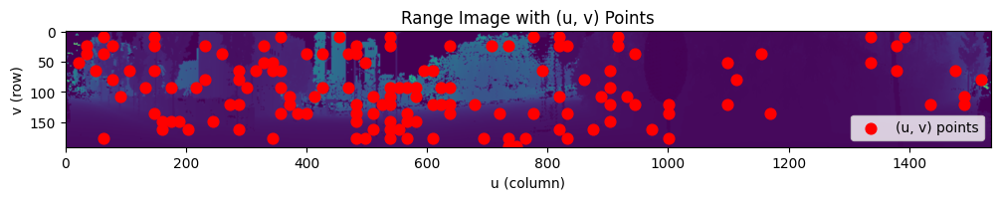

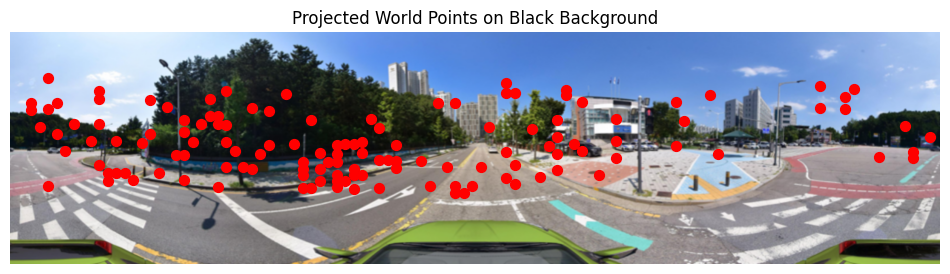

PnP Solving computational runtime: 80.66 ms
Estimated pose: tx=6.92, ty=0.01, yaw=-62.44 deg
Compensated Query UTM: [ 305922.89226831 4133921.85641177], yaw: 91.06 deg
True Query UTM: [ 305905.8093 4133915.594 ], yaw: -35.00 deg
Δ East: 17.08 m, Δ North: 6.26 m, Δ Yaw: 126.06 deg


In [34]:
from scipy.spatial.transform import Rotation as R
import time

# Query와 DB의 UTM 좌표 차이 출력
query_pos = valid_dataset.dbStruct.posQ[qIdx][0:2]
db_pos = valid_dataset.dbStruct.posDb[dbIdx][0:2]

query_heading = valid_dataset.dbStruct.posQ[qIdx][3:7]
db_heading = valid_dataset.dbStruct.posDb[dbIdx][3:7]

# Convert quaternions (w, x, y, z) to (x, y, z, w) for scipy
query_rot = R.from_quat([query_heading[1], query_heading[2], query_heading[3], query_heading[0]])
db_rot = R.from_quat([db_heading[1], db_heading[2], db_heading[3], db_heading[0]])

# Extract yaw (heading) in degrees (rotation around Z axis)
query_yaw = query_rot.as_euler('zyx', degrees=True)[0]
db_yaw = db_rot.as_euler('zyx', degrees=True)[0]

heading_delta = db_yaw - query_yaw
delta = db_pos - query_pos

print(f"Δ East: {delta[0]:.2f} m, Δ North: {delta[1]:.2f} m, Δ heading: {heading_delta:.2f} deg")

W_l, H_l = range_image.shape[1], range_image.shape[0]
cam_height = 0.0  # 카메라 높이 (m)

world_points, image_points = [], []

# 사용 예시
world_points, image_points = collect_world_and_image_points(filtered_matches, grid_size, range_image, scale_factor=scale_factor, plot=True)

# world_points의 각 점의 z값에 1을 더해줌
world_points = [np.array([p[0], p[1], p[2] + 1.0]) for p in world_points]

db_equi = db_img.copy()
H_l, W_l = db_equi.shape[:2]

# Project each 3D point
proj_uv = [project_equirectangular(P, W_l, H_l) for P in world_points]
u_coords = [int(u) for u, v in proj_uv]
v_coords = [int(v) for u, v in proj_uv]

# 이미지 범위 내에 있는 점만 필터링
valid_indices = [
    i for i, (u, v) in enumerate(proj_uv)
    if 0 <= u < W_l and 0 <= v < H_l
]

# 필터링된 world_points와 image_points
world_points = [world_points[i] for i in valid_indices]
image_points = [image_points[i] for i in valid_indices]
u_coords = [u_coords[i] for i in valid_indices]
v_coords = [v_coords[i] for i in valid_indices]

# for idx, uv in enumerate(proj_uv):
#     print(f"Projected point {idx}: u={uv[0]:.2f}, v={uv[1]:.2f}")

# Plot
plt.figure(figsize=(12, 6))
plt.imshow(db_equi)
plt.scatter(u_coords, v_coords, c='red', s=50, marker='o')
plt.title("Projected World Points on Black Background")
plt.axis('off')
plt.show()

# 5) Levenberg–Marquardt 최적화로 pose 추정
if len(world_points) < 3:
    raise RuntimeError("Not enough correspondences for pose estimation.")

def fun(params):
    # params: [tx, ty, tz, yaw]
    return residuals(params, world_points, image_points, W_l, H_l, cam_height)

# robust estimation 적용 (xyz, yaw)
sol = least_squares(
    fun,
    x0=np.zeros(4),         # [tx, ty, tz, yaw]
    method='trf',
    loss='huber',
    f_scale=5.0
)
# PnP Solving computational runtime measurement
pnp_start_time = time.time()

# robust estimation 적용 (xyz, yaw)
sol = least_squares(
    fun,
    x0=np.zeros(4),         # [tx, ty, tz, yaw]
    method='trf',
    loss='huber',
    f_scale=5.0
)

pnp_end_time = time.time()
pnp_elapsed_ms = (pnp_end_time - pnp_start_time) * 1000
print(f"PnP Solving computational runtime: {pnp_elapsed_ms:.2f} ms")
tx, ty, _, yaw = sol.x

print(f"Estimated pose: tx={tx:.2f}, ty={ty:.2f}, yaw={np.rad2deg(yaw):.2f} deg")

# DB의 UTM 좌표
db_utm = valid_dataset.dbStruct.utmDb[dbIdx]

# 보정된 Query UTM 좌표 계산
estimated_query_utm = np.array([db_utm[0] + tx, db_utm[1] + ty])

# 보정된 Query yaw (라디안)
db_q = valid_dataset.dbStruct.posDb[dbIdx]
db_quat = [db_q[3], db_q[4], db_q[5], db_q[6]]  # [w, x, y, z]
db_rot = R.from_quat([db_quat[1], db_quat[2], db_quat[3], db_quat[0]])
db_yaw_rad = db_rot.as_euler('zyx')[0]
estimated_query_yaw = db_yaw_rad + yaw

print(f"Compensated Query UTM: {estimated_query_utm}, yaw: {np.rad2deg(estimated_query_yaw):.2f} deg")
print(f"True Query UTM: {valid_dataset.dbStruct.utmQ[qIdx]}, yaw: {query_yaw:.2f} deg")
# yaw difference normalization to [-180, 180] degrees
yaw_error = np.rad2deg(estimated_query_yaw) - query_yaw
if yaw_error > 180:
    yaw_error -= 360
elif yaw_error < -180:
    yaw_error += 360

print(f"Δ East: {estimated_query_utm[0] - valid_dataset.dbStruct.utmQ[qIdx][0]:.2f} m, "
      f"Δ North: {estimated_query_utm[1] - valid_dataset.dbStruct.utmQ[qIdx][1]:.2f} m, "
      f"Δ Yaw: {yaw_error:.2f} deg")
